## Import Libraries

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## Import Input Data

In [4]:
data = pd.read_csv('/content/Real_Combine.csv')
data.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


##Check Null Values

In [5]:
data.isnull().sum()[data.isnull().sum() > 0]

PM 2.5    2
dtype: int64

#### The output label PM2.5 has 2 null values.

##Drop NULL Values

In [0]:
data = data.dropna()

##Separate out Independent Features and Dependent Features

In [0]:
X = data.iloc[:,:-1]
Y = data.iloc[:,-1]

##Split the data into Training and Test sets

In [0]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.2,random_state=1)

##Check Corelation among the Features variables

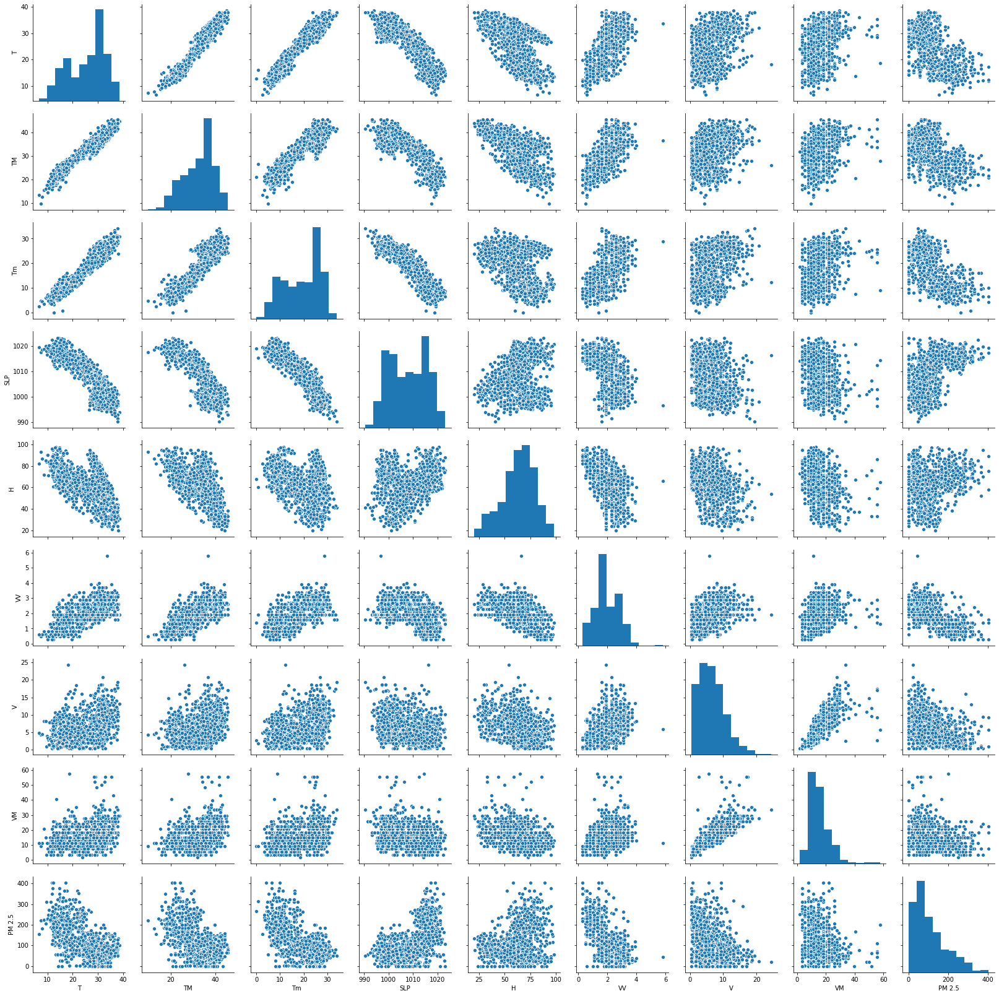

In [9]:
sns.pairplot(data)

##Correlation Matrix with Heatmap
Correlation states how the features are related to each other or the target variable.

Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library

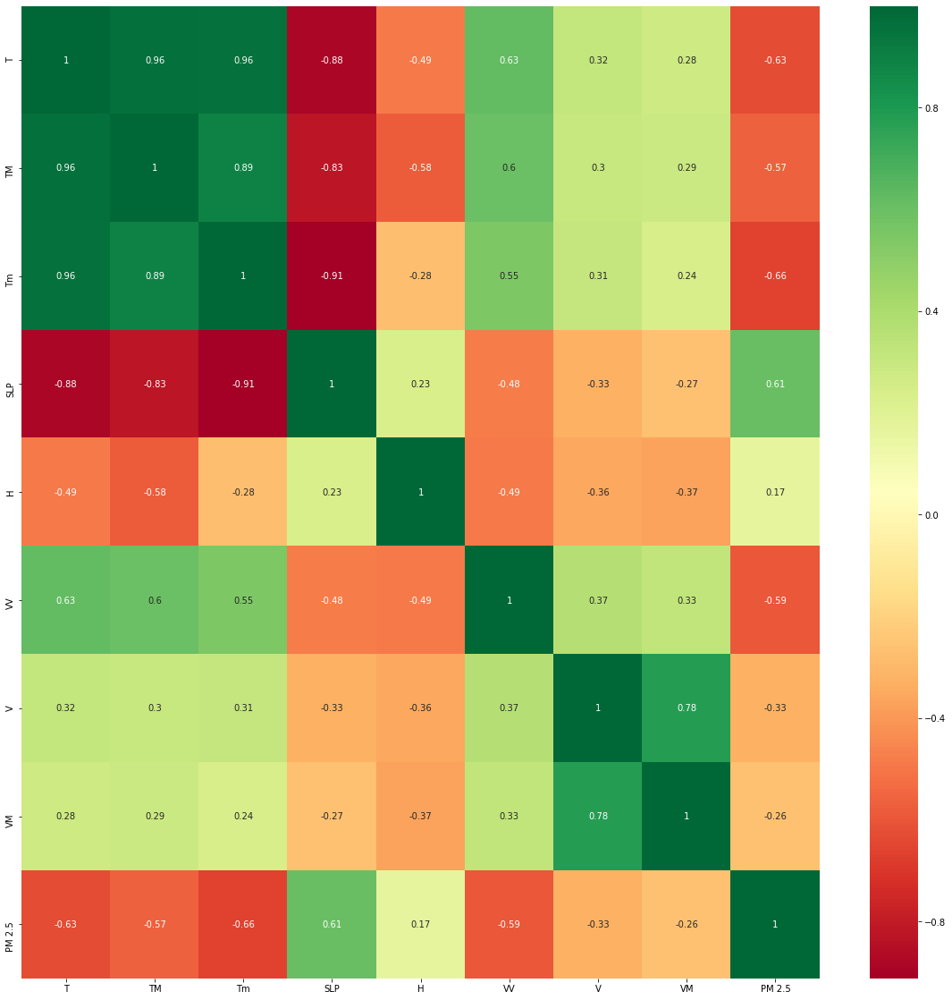

In [10]:
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [11]:
top_corr_features 

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

## Visualize the Label

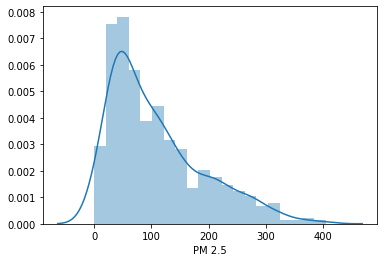

In [12]:
sns.distplot(Y)

##Decison Tree Regressor

In [0]:
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor(criterion='mse')


In [36]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [37]:
print(f'Training Score: {dtree.score(X_train,y_train)}')
print(f'Test Score: {dtree.score(X_test,y_test)}')

Training Score: 1.0
Test Score: 0.19341687284741638


#### the above scenario clearly shows a case of overfitting

## Cross Validation to avoid overfitting

In [0]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(dtree,X,Y,cv=5)

In [39]:
score.mean()

0.02720397670360588

##Tree Visualization

In [0]:
from IPython.display import Image  
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus ## display tree

In [43]:
features = list(data.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [44]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.70447 to fit



##Model Evaluation

In [0]:
y_pred = dtree.predict(X_test)

####Visualization of the proximity of predictions

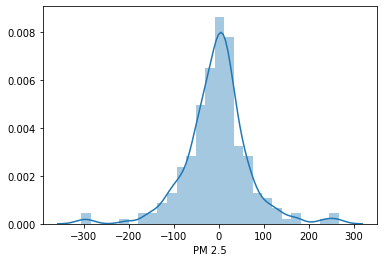

In [46]:
sns.distplot(y_test - y_pred)

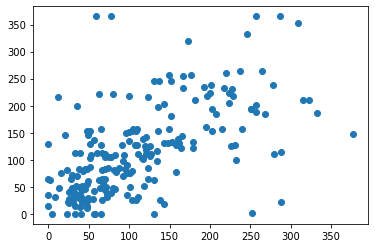

In [47]:

plt.scatter(y_test,y_pred)

##HyperParameter Tuning

In [0]:
from sklearn.model_selection import GridSearchCV

In [0]:
params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
 "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
 "max_leaf_nodes":[None,10,20,30,40,50,60,70]   
}

In [0]:
random_search=GridSearchCV(DecisionTreeRegressor(),param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [0]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [53]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X,Y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 8138 tasks      | elapsed:   31.9s
[Parallel(n_jobs=-1)]: Done 15306 tasks      | elapsed:   58.9s
[Parallel(n_jobs=-1)]: Done 24522 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 35786 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 49098 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 64458 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 81866 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 101322 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  6.3min finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. 


 Time taken: 0 hours 6 minutes and 19.22 seconds.


In [54]:
print(f'Best Parameters for Decision Tree Regressor :{random_search.best_params_}')

Best Parameters for Decision Tree Regressor :{'max_depth': 15, 'max_features': 'log2', 'max_leaf_nodes': 60, 'min_samples_leaf': 3, 'min_weight_fraction_leaf': 0.1, 'splitter': 'best'}


In [55]:
print(f'Best Cross Validation Score ; {random_search.best_score_}')

Best Cross Validation Score ; -3275.9341113264113


In [0]:
y_pred = random_search.predict(X_test)

## Distance Plot

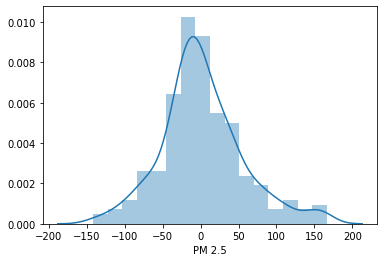

In [57]:
sns.distplot(y_test - y_pred)

## Visualization Of Model Performance

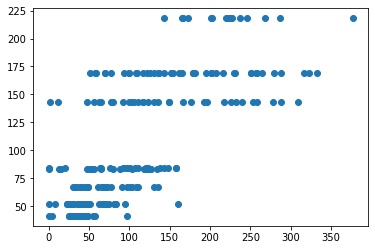

In [58]:
plt.scatter(y_test,y_pred)

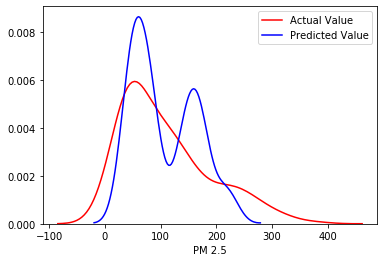

In [59]:
ax1 = sns.distplot(y_test,hist=False,color='r',label='Actual Value')
sns.distplot(y_pred,hist=False,color='b',label='Predicted Value')

## Regression Evaluation Metrics
Here are three common evaluation metrics for regression problems:

- **Mean Absolute Error (MAE)** is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$
- **Mean Squared Error (MSE)** is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$
- **Root Mean Squared Error (RMSE)** is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$
Comparing these metrics:

- MAE is the easiest to understand, because it's the average error.
- MSE is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
-RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units.

In [60]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
print(f'Mean Absolute Error : {mean_absolute_error(y_test,y_pred)}')
print(f'Mean Squared Error : {mean_squared_error(y_test,y_pred)}')
print(f'Root Mean Squared Error : {np.sqrt(mean_squared_error(y_test,y_pred))}')
print(f'R squared error : {r2_score(y_test,y_pred)}')

Mean Absolute Error : 40.413860346318444
Mean Squared Error : 2981.601436299679
Root Mean Squared Error : 54.60404230732079
R squared error : 0.5306992749716093


#### Hyperparameter tuning of Decision Forest leads to a very Generalized Model and the model evaluation will actually fall in place when we have large amount of training data

## Save The Model

In [0]:
import pickle
File = open('DecisionTreeRegressor_model.pkl','wb')
pickle.dump(random_search,File)
File.close()

## Applying Random Forest Regressor

In [0]:
from sklearn.ensemble import RandomForestRegressor

In [0]:
rf = RandomForestRegressor()

In [0]:
parameters = { 
            "n_estimators"      : [10,20,30],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True, False],
            }

In [65]:
rf_grid_search = GridSearchCV(rf,parameters,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)
rf_grid_search.fit(X,Y)

Fitting 10 folds for each of 54 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 496 tasks      | elapsed:   32.6s
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   35.2s finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=False),
             iid='warn', n_jobs=-1,
             param_grid={'bootstrap': [True, False],
    

In [66]:
print(f'The Best Parameters obtained by Grid Search : {rf_grid_search.best_params_}')

The Best Parameters obtained by Grid Search : {'bootstrap': True, 'max_features': 'sqrt', 'min_samples_split': 8, 'n_estimators': 30}


In [67]:
print(f'The Best Scores Obtained by Grid Search : {rf_grid_search.best_score_}')

The Best Scores Obtained by Grid Search : -3150.636855591546


In [0]:
y_pred = rf_grid_search.predict(X_test)

## Visualization of Model Performance

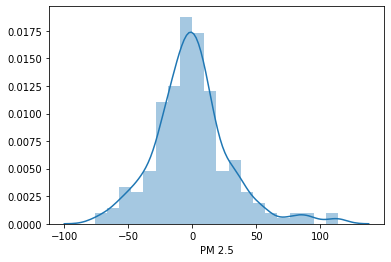

In [69]:
sns.distplot(y_test - y_pred)

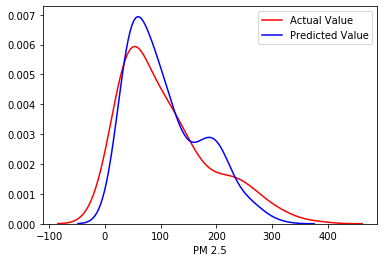

In [70]:
ax = sns.distplot(y_test,hist=False,color='r',label='Actual Value')
sns.distplot(y_pred,hist=False,color='b',label='Predicted Value')

## Regression Evaluation Metrics
Here are three common evaluation metrics for regression problems:

- **Mean Absolute Error (MAE)** is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$
- **Mean Squared Error (MSE)** is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$
- **Root Mean Squared Error (RMSE)** is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$
Comparing these metrics:

- MAE is the easiest to understand, because it's the average error.
- MSE is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
-RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units.

In [71]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
print(f'Mean Absolute Error : {mean_absolute_error(y_test,y_pred)}')
print(f'Mean Squared Error : {mean_squared_error(y_test,y_pred)}')
print(f'Root Mean Squared Error : {np.sqrt(mean_squared_error(y_test,y_pred))}')
print(f'R squared error : {r2_score(y_test,y_pred)}')

Mean Absolute Error : 21.48828982807051
Mean Squared Error : 888.8958131035683
Root Mean Squared Error : 29.814355822381412
R squared error : 0.8600887950731866


#### Note :
The Random Forest Regressor gives better predictions

In [78]:
rf = rf_grid_search.best_estimator_
rf.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='sqrt', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=8,
                      min_weight_fraction_leaf=0.0, n_estimators=30,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

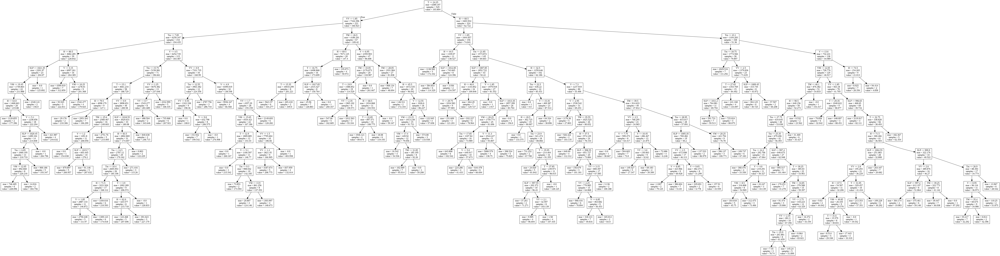

In [86]:
from sklearn.tree import export_graphviz
import six
from IPython import display
from sklearn import tree
dotfile = six.StringIO()
i_tree = 0
for tree_in_forest in rf.estimators_:
    if (i_tree ==5):        
        tree.export_graphviz(tree_in_forest, feature_names=features,out_file=dotfile)
        graph = pydotplus.graph_from_dot_data(dotfile.getvalue())        
    i_tree = i_tree + 1
Image(graph.create_png())

In [0]:
y_pred = rf.predict(X_test)

In [89]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
print(f'Mean Absolute Error : {mean_absolute_error(y_test,y_pred)}')
print(f'Mean Squared Error : {mean_squared_error(y_test,y_pred)}')
print(f'Root Mean Squared Error : {np.sqrt(mean_squared_error(y_test,y_pred))}')
print(f'R squared error : {r2_score(y_test,y_pred)}')

Mean Absolute Error : 35.56577765471066
Mean Squared Error : 2472.586339594209
Root Mean Squared Error : 49.725107738387145
R squared error : 0.610817680814188


## Visualization of Predictions

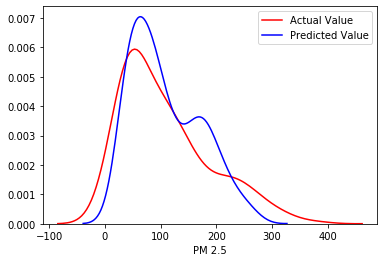

In [92]:
ax = sns.distplot(y_test,hist=False,color='r',label='Actual Value')
sns.distplot(y_pred,hist=False,color='b',label='Predicted Value')

## Save Random Forest Model

In [0]:
file = open('Random_Forest_Regressor_Model.pkl','wb')
pickle.dump(rf,file)
file.close()